## Adult Income Dataset Analysis

### Problem Statement
The objective of this project is to analyze the Adult Income dataset to understand the factors influencing income levels and build a predictive model to classify individuals into income categories (<=50K or >50K).

#### Summary

1. Data Exploration: The dataset contains information about individuals including demographic features such as age, education, occupation, and marital status, as well as financial attributes like capital gain and loss. Initial exploration involved data visualization and summary statistics to understand the distribution and relationships between variables.

2. Data Preprocessing: Categorical variables were one-hot encoded, missing values were handled, and unnecessary columns were dropped. Additionally, the dataset was split into training and testing sets for model evaluation.

3. Model Building: Initially, a random forest classifier was trained with default parameters. Hyperparameter tuning was performed using GridSearchCV to find the best set of parameters for improved model performance.

4. Model Evaluation: Model performance was evaluated using accuracy score on the test set before and after hyperparameter tuning.

Kaggle link: https://www.kaggle.com/datasets/wenruliu/adult-income-dataset/data

### About the dataset

Description:

- age: continuous.  <br>

- workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked. <br>

- fnlwgt: continuous. <br>

- education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool. <br>

- education-num: continuous. <br>

- marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse. <br>

- occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces. <br>

- relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried. <br>

- race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black. <br>

- sex: Female, Male. <br>

- capital-gain: continuous. <br>

- capital-loss: continuous. <br>

- hours-per-week: continuous. <br>

- native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, - France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands. <br>

- class: >50K, <=50K

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

import plotly.graph_objs as go
import plotly.io as pio

In [2]:
# Load the dataset

data = pd.read_csv('adult.csv')

In [3]:
# Check for missing values

data.isna().sum()

age                0
workclass          0
fnlwgt             0
education          0
educational-num    0
marital-status     0
occupation         0
relationship       0
race               0
gender             0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

In [7]:
# Display first few rows of the dataset

data.head(3)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K


In [8]:
# Get information about the dataset

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [9]:
# Descriptive statistics of the dataset

data.describe()


,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


In [10]:
# Count of different education levels

data['education'].value_counts()


education
HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: count, dtype: int64

In [11]:
# Summary statistics for the 'age' column

data['age'].aggregate(['min','max','mean'])


min     17.000000
max     90.000000
mean    38.643585
Name: age, dtype: float64

In [12]:
# Count of each occupation

data.occupation.value_counts()


occupation
Prof-specialty       6172
Craft-repair         6112
Exec-managerial      6086
Adm-clerical         5611
Sales                5504
Other-service        4923
Machine-op-inspct    3022
?                    2809
Transport-moving     2355
Handlers-cleaners    2072
Farming-fishing      1490
Tech-support         1446
Protective-serv       983
Priv-house-serv       242
Armed-Forces           15
Name: count, dtype: int64

In [13]:
# Count of each workclass

data.workclass.value_counts()


workclass
Private             33906
Self-emp-not-inc     3862
Local-gov            3136
?                    2799
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: count, dtype: int64

# Income by age

In [19]:
# Create subplots
fig = go.Figure()

# Add histogram for income > 50K
fig.add_trace(go.Histogram(x=data[data['income'] == '>50K']['age'], 
                            marker=dict(color='green', opacity=0.7),
                            name='Income more than 50,000'))

# Add histogram for income <= 50K
fig.add_trace(go.Histogram(x=data[data['income'] == '<=50K']['age'], 
                            marker=dict(color='yellow', opacity=0.7),
                            name='Income less than 50,000'))

# Update layout
fig.update_layout(barmode='overlay', 
                  xaxis=dict(title='Age'), 
                  yaxis=dict(title='Frequency'),
                  title='Distribution of Age by Income Level')

# Show plot
fig.show()

# Save as PNG
pio.write_image(fig, 'IncomevAge.png')


![Plot](IncomevAge.png)

In [21]:
data_less_than_50k = data[data['income'] == '<=50K']
data_more_than_50k = data[data['income'] == '>50K']

# Income by Marital Status

In [26]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data_less_than_50k['marital-status'],
    y=data_less_than_50k['hours-per-week'],
    name='Income <=50K',
    marker=dict(color='blue')  # Color for <=50K bars
))

# Add bar trace for income >50K
fig.add_trace(go.Bar(
    x=data_more_than_50k['marital-status'],
    y=data_more_than_50k['hours-per-week'],
    name='Income >50K',
    marker=dict(color='green')  # Color for >50K bars
))

# Update the layout
fig.update_layout(
    title="Hours per Week by Marital Status and Income Level",
    xaxis=dict(title='Marital Status'),
    yaxis=dict(title='Hours per Week'),
    barmode='group'
)

# Update traces to customize appearance
fig.update_traces(dict(marker_line_width=0))

# Show the figure
fig.show()

# Save as PNG
pio.write_image(fig, 'IncomevMartial.png')

![Plot](IncomevMartial.png)

From the above graph, Here are some key observations:

1. Higher Working Hours for Married Individuals (<=50K):

    Individuals who are "Married-civ-spouse" have high working hours per week, especially in the income category <=50K. This indicates that married individuals with a spouse present tend to work a significant number of hours regardless of their income level.

2. Significant Hours for Never-Married Individuals (<=50K):

    "Never-married" individuals also show high working hours in the income category <=50K. This could suggest that never-married individuals, while earning less, are working a considerable number of hours.

3. Widowed, Divorced, Separated, and Married-Spouse-Absent Categories:

    These categories show lower working hours per week overall. This could indicate less involvement in full-time work or potential part-time employment.

4. Income >50K Distribution:

    For individuals with income >50K, "Married-civ-spouse" is the predominant category with significant working hours. Other marital statuses in this income bracket have relatively lower working hours, indicating a possible correlation between being married and achieving higher income.

5. Comparison Across Income Levels:

    The majority of high working hours are observed in the income category <=50K. This could suggest that individuals in this income group might need to work more hours to meet their financial needs.
For the income category >50K, fewer marital status categories show high working hours, implying that higher income may not necessarily correlate with longer working hours for some marital statuses.

Overall, the graph suggests a strong relationship between marital status, working hours, and income levels. Married individuals (especially with a spouse present) seem to work longer hours, whether their income is high or low, while other marital statuses exhibit more variability in working hours, particularly in the lower income category.

# Income by gender

In [27]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data_less_than_50k['gender'],
    y=data_less_than_50k['hours-per-week'],
    name='Income <=50K',
    marker=dict(color='purple')  # Color for <=50K bars
))

# Add bar trace for income >50K
fig.add_trace(go.Bar(
    x=data_more_than_50k['gender'],
    y=data_more_than_50k['hours-per-week'],
    name='Income >50K',
    marker=dict(color='black')  # Color for >50K bars
))

# Update the layout
fig.update_layout(
    title="Hours per Week by Gender and Income Level",
    xaxis=dict(title='gender'),
    yaxis=dict(title='Hours per Week'),
    barmode='group'
)

# Update traces to customize appearance
fig.update_traces(marker_line_width=0)

# Show the figure
fig.show()

# Save as PNG
pio.write_image(fig, 'IncomevGender.png')

![Plot](IncomevGender.png)

From the above graph, Here are some key observations:

1. Higher working hours for male:

    Males tend to work more compared to females.

2. Income >50K distriution:

    Males tend to earn more than females.

# Income based on Education

In [29]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data_less_than_50k['education'],
    y=data_less_than_50k['hours-per-week'],
    name='Income <=50K',
    marker=dict(color='brown')  # Color for <=50K bars
))

# Add bar trace for income >50K
fig.add_trace(go.Bar(
    x=data_more_than_50k['education'],
    y=data_more_than_50k['hours-per-week'],
    name='Income >50K',
    marker=dict(color='grey')  # Color for >50K bars
))

# Update the layout
fig.update_layout(
    title="Hours per Week by education and Income Level",
    xaxis=dict(title='education'),
    yaxis=dict(title='Hours per Week'),
    barmode='group'
)

# Update traces to customize appearance
fig.update_traces(marker_line_width=0)

# Show the figure
fig.show()

# Save as PNG
pio.write_image(fig, 'IncomevEdu.png', width=1000, height=800, scale=2)  # Increase scale for better resolution


![Plot](IncomevEduc.png)

From the above graph, Here are some key observations:

1. Higher income with higher degrees:

    Candidates who have completed higher education such as Master's, Doctorate tend to earn more

2. A lot of people start working after graduating highschool. A majority of them earn less than 50K

3. It is quite obvious from the data that very few people have incomes more than 50K who have not graduated Highschool.

# Income by Native-country

In [30]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data_less_than_50k['occupation'],
    y=data_less_than_50k['hours-per-week'],
    name='Income <=50K',
    marker=dict(color='black')  # Color for <=50K bars
))

# Add bar trace for income >50K
fig.add_trace(go.Bar(
    x=data_more_than_50k['occupation'],
    y=data_more_than_50k['hours-per-week'],
    name='Income >50K',
    marker=dict(color='gold')  # Color for >50K bars
))

# Update the layout
fig.update_layout(
    title="Hours per Week by occupation and Income Level",
    xaxis=dict(title='occupation'),
    yaxis=dict(title='Hours per Week'),
    barmode='group'
)

# Update traces to customize appearance
fig.update_traces(marker_line_width=0)

# Show the figure
fig.show()

# Save as PNG
pio.write_image(fig, 'NativevCountry.png', width=1000, height=800, scale=2)  # Increase scale for better resolution

![Plot](NativevCountry.png)

From the above graph we can see that most of the jobs pay less than 50K unless it is more specialized or executive managerial roles

# Income by relationship

In [31]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=data_less_than_50k['relationship'],
    y=data_less_than_50k['hours-per-week'],
    name='Income <=50K',
    marker=dict(color='black')  # Color for <=50K bars
))

# Add bar trace for income >50K
fig.add_trace(go.Bar(
    x=data_more_than_50k['relationship'],
    y=data_more_than_50k['hours-per-week'],
    name='Income >50K',
    marker=dict(color='gold')  # Color for >50K bars
))

# Update the layout
fig.update_layout(
    title="Hours per Week by relationship and Income Level",
    xaxis=dict(title='relationship'),
    yaxis=dict(title='Hours per Week'),
    barmode='group'
)

# Update traces to customize appearance
fig.update_traces(marker_line_width=0)

# Show the figure
fig.show()

# Save as PNG
pio.write_image(fig, 'IncomevRelationship.png', width=1000, height=800, scale=2)  # Increase scale for better resolution

![Plot](IncomevRelationship.png)

From the above graph, here are the key observations:

1. Husbands tend to have incomes more than 50K
2. Everyone else tend to earn less


In [210]:
data.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country',
       'income'],
      dtype='object')

In [211]:
data.head(5)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


In [212]:
# Data preprocessing

# Drop 'education' column

data = data.drop('education', axis=1) 

# Preparing data for random forest

We're employing one-hot encoding for the following categorical columns: Occupation, Workclass, Marital Status, Relationship, Race and Native country. 

Additionally, given the binary nature of Gender and Income, we'll encode them accordingly.

In [213]:
# Convert categorical columns to dummy variables

data = pd.concat([data.drop('occupation', axis=1), pd.get_dummies(data.occupation).add_prefix('occupation_')], axis=1)
data = pd.concat([data.drop('workclass', axis=1), pd.get_dummies(data.workclass).add_prefix('workclass_')], axis=1)
data = pd.concat([data.drop('marital-status', axis=1), pd.get_dummies(data['marital-status']).add_prefix('marital-status_')], axis=1)
data = pd.concat([data.drop('relationship', axis=1), pd.get_dummies(data.relationship).add_prefix('relationship_')], axis=1)
data = pd.concat([data.drop('race', axis=1), pd.get_dummies(data.race).add_prefix('race_')], axis=1)
data = pd.concat([data.drop('native-country', axis=1), pd.get_dummies(data['native-country']).add_prefix('native-country_')], axis=1)

# Convert 'gender' and 'income' columns to numeric

data['gender'] = data['gender'].apply(lambda x: 1 if x == 'Male' else 0)
data['income'] = data['income'].apply(lambda x: 1 if x == '>50K' else 0)

In [214]:
data.head(2)

,age,fnlwgt,educational-num,gender,capital-gain,capital-loss,hours-per-week,income,occupation_?,occupation_Adm-clerical,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
0,25,226802,7,1,0,0,40,0,False,False,...,False,False,False,False,False,False,False,True,False,False
1,38,89814,9,1,0,0,50,0,False,False,...,False,False,False,False,False,False,False,True,False,False


<Axes: >

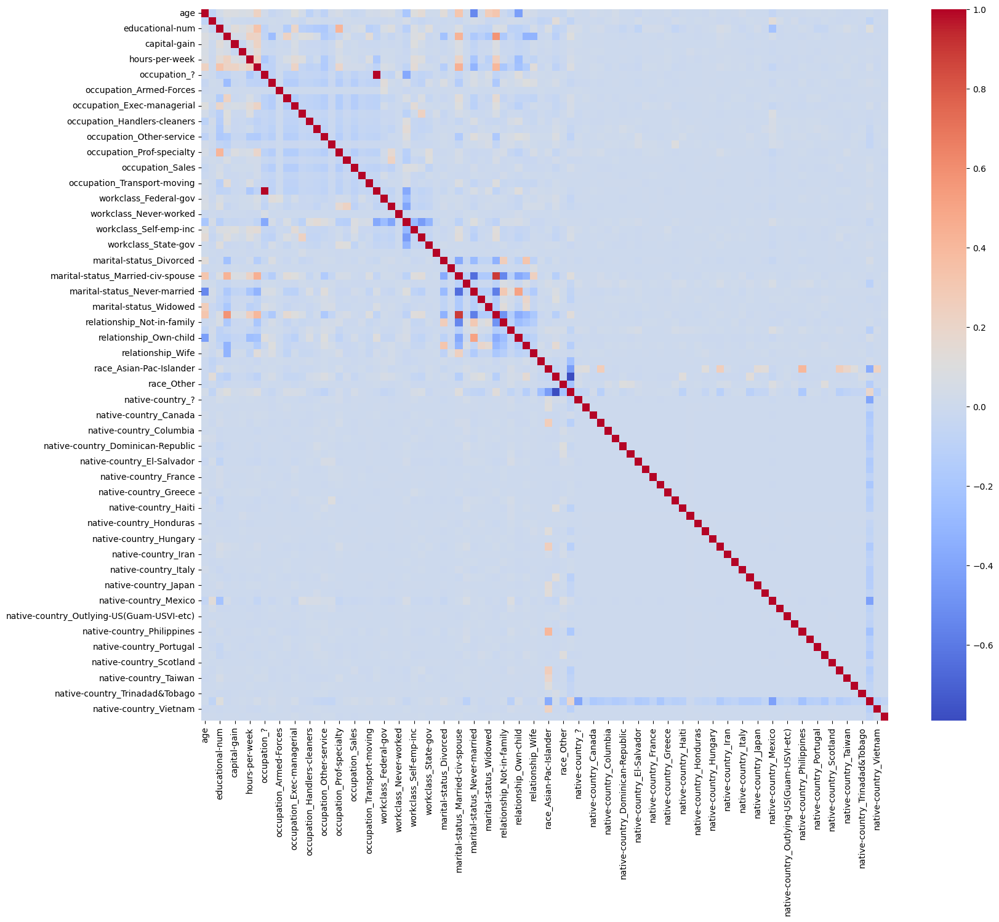

In [215]:
# Visualize correlation matrix

import seaborn as sns

plt.figure(figsize=(18,15))
sns.heatmap(data.corr(),annot=False,cmap='coolwarm')

In [216]:
# Feature selection based on correlation

sort_correlations = (data.corr()['income'].abs()).sort_values()
num_drop = int(0.8 * len(data.columns)) # selects the first 80% of the sorted correlations
droped_columns = sort_correlations.iloc[:num_drop].index
data_droped = data.drop(droped_columns , axis =1)

### Visualize correlation matrix after feature selection


<Axes: >

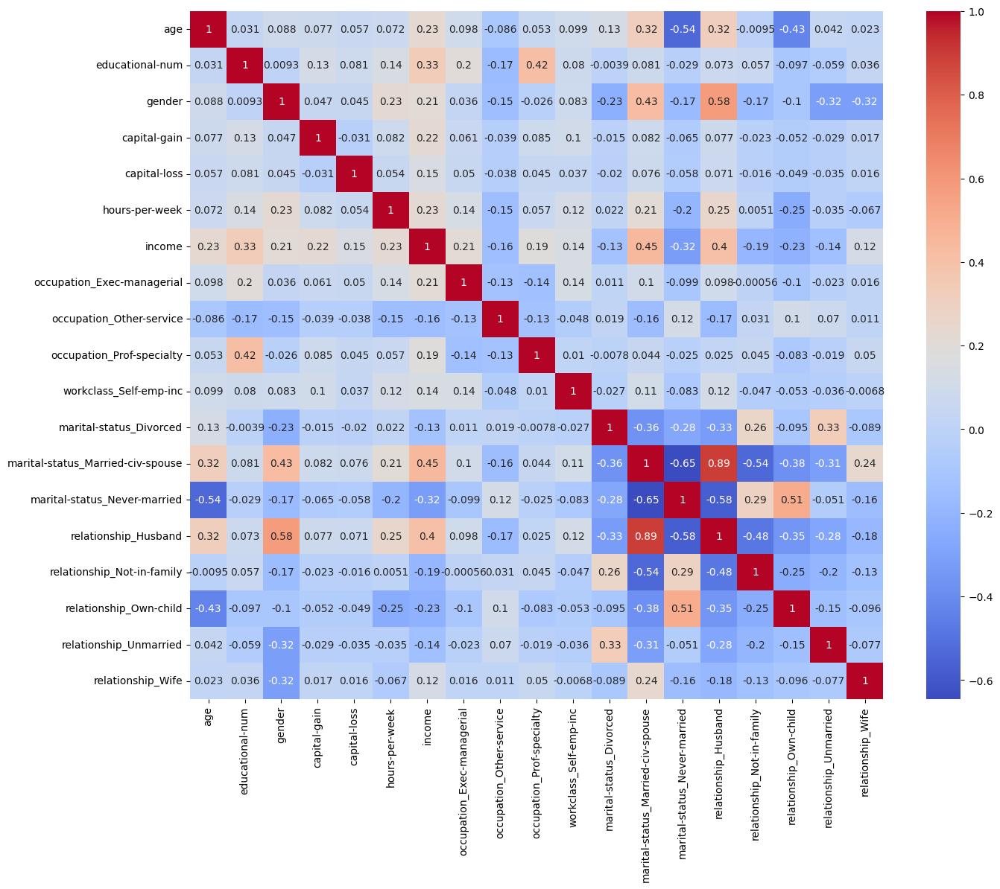

In [217]:
plt.figure(figsize = (15,12))
sns.heatmap(data_droped.corr() , cmap='coolwarm',annot = True)

In [218]:
# Drop 'fnlwgt' column

data.drop('fnlwgt', axis = 1, inplace=True)

# Replace '?' with NaN

data = data.replace('?', np.nan)

In [219]:
data.head(5)

,age,educational-num,gender,capital-gain,capital-loss,hours-per-week,income,occupation_?,occupation_Adm-clerical,occupation_Armed-Forces,...,native-country_Portugal,native-country_Puerto-Rico,native-country_Scotland,native-country_South,native-country_Taiwan,native-country_Thailand,native-country_Trinadad&Tobago,native-country_United-States,native-country_Vietnam,native-country_Yugoslavia
0,25,7,1,0,0,40,0,False,False,False,...,False,False,False,False,False,False,False,True,False,False
1,38,9,1,0,0,50,0,False,False,False,...,False,False,False,False,False,False,False,True,False,False
2,28,12,1,0,0,40,1,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,44,10,1,7688,0,40,1,False,False,False,...,False,False,False,False,False,False,False,True,False,False
4,18,10,0,0,0,30,0,True,False,False,...,False,False,False,False,False,False,False,True,False,False


### We will use the random forest classifier. The data above is encoded and ready

In [220]:
# Split data into train and test sets in ratio of 80:20

from sklearn.model_selection import train_test_split

train , test = train_test_split(data,test_size=0.2)

In [221]:
# Print shapes of train and test sets

print(f'The shape of the training data is: {train.shape}')
print(f'The shape of the test data is: {test.shape}')

The shape of the training data is: (39073, 91)
The shape of the test data is: (9769, 91)


In [222]:
x_train = data.drop('income', axis = 1)
y_train = data['income']

In [227]:
x_test = data.drop('income', axis = 1)
y_test = data['income']

In [234]:
# Random Forest model training

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

random_model = RandomForestClassifier()
random_model.fit(x_train , y_train)

RandomForestClassifier()

Now, we'll assess the performance of the RandomForestClassifier on the given test data. A higher score indicates better predictive accuracy of the classifier on new, unseen data.

In [235]:
random_model.score(x_test,y_test)

0.971745628762131

In [233]:
random_model.feature_names_in_

array(['age', 'educational-num', 'gender', 'capital-gain', 'capital-loss',
       'hours-per-week', 'occupation_?', 'occupation_Adm-clerical',
       'occupation_Armed-Forces', 'occupation_Craft-repair',
       'occupation_Exec-managerial', 'occupation_Farming-fishing',
       'occupation_Handlers-cleaners', 'occupation_Machine-op-inspct',
       'occupation_Other-service', 'occupation_Priv-house-serv',
       'occupation_Prof-specialty', 'occupation_Protective-serv',
       'occupation_Sales', 'occupation_Tech-support',
       'occupation_Transport-moving', 'workclass_?',
       'workclass_Federal-gov', 'workclass_Local-gov',
       'workclass_Never-worked', 'workclass_Private',
       'workclass_Self-emp-inc', 'workclass_Self-emp-not-inc',
       'workclass_State-gov', 'workclass_Without-pay',
       'marital-status_Divorced', 'marital-status_Married-AF-spouse',
       'marital-status_Married-civ-spouse',
       'marital-status_Married-spouse-absent',
       'marital-status_Never-mar

The `GridSearchCV` will evaluate the model's performance for each combination using cross-validation and will provide the best combination of hyperparameters at the end of the search. 

In [238]:
param_estimators = {
    'n_estimators':[50,100,150],
    'max_depth':[5,10,20,None],
    'min_samples_split':[2,4],
    'max_features':['sqrt','log2']
}

grid_search = GridSearchCV(estimator=RandomForestClassifier(),param_grid=param_estimators,verbose=10)
grid_search

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 20, None],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 4],
                         'n_estimators': [50, 100, 150]},
             verbose=10)

In [239]:
grid_search.fit(x_train,y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV 1/5; 1/48] START max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50
[CV 1/5; 1/48] END max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.833 total time=   0.9s
[CV 2/5; 1/48] START max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50
[CV 2/5; 1/48] END max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.831 total time=   0.9s
[CV 3/5; 1/48] START max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50
[CV 3/5; 1/48] END max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.843 total time=   0.9s
[CV 4/5; 1/48] START max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50
[CV 4/5; 1/48] END max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50;, score=0.831 total time=   0.8s
[CV 5/5; 1/48] START max_depth=5, max_features=sqrt, min_samples_split=2, n_estimators=50
[CV 

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [5, 10, 20, None],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 4],
                         'n_estimators': [50, 100, 150]},
             verbose=10)

In [240]:
# Get the best estimator from grid search

grid_search.best_estimator_

RandomForestClassifier(max_depth=20, min_samples_split=4, n_estimators=50)

In [241]:
# Calculate accuracy on test set using best estimator

best_forest=grid_search.best_estimator_
best_forest.score(x_test,y_test)

0.8934318823962982

In this code, `best_forest.estimators_[0]` extracts the first decision tree from the random forest. `max_depth=3` limits the depth of the displayed tree to 3 levels.

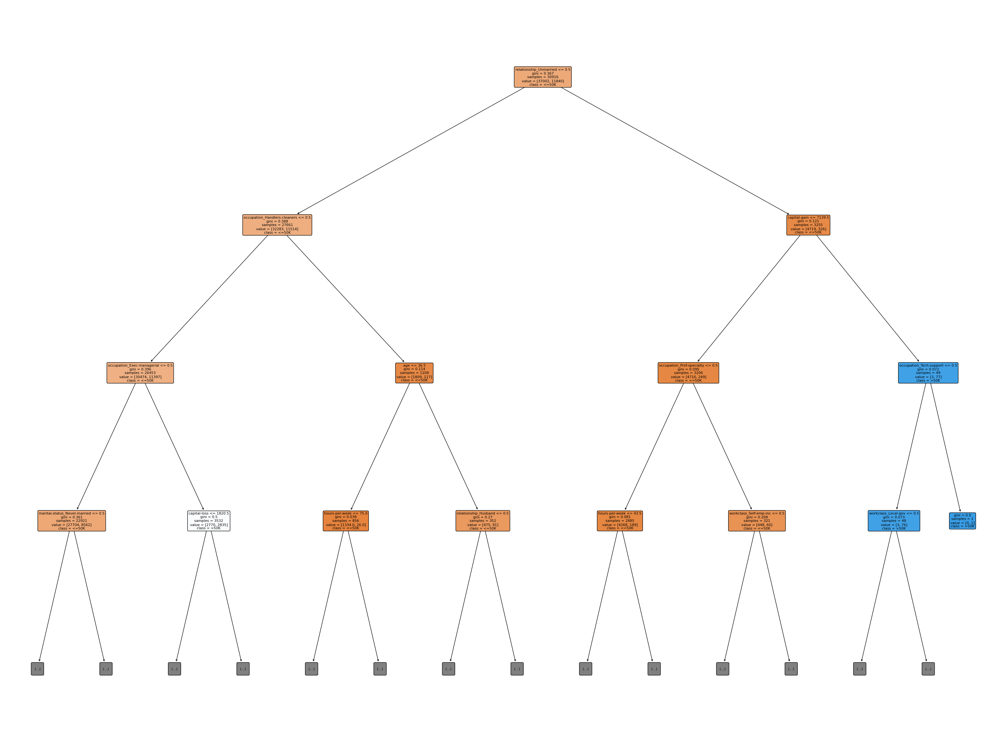

In [251]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Extract one of the decision trees from the random forest
tree = best_forest.estimators_[0]

# Plot the simplified decision tree with a maximum depth of 3
plt.figure(figsize=(40,30))
plot_tree(tree, feature_names=x_train.columns, class_names=['<=50K', '>50K'], filled=True, rounded=True, max_depth=3)
plt.show()

#### Conclusion

The initial random forest classifier achieved an accuracy of approximately 97.17% on the test set.
After hyperparameter tuning, the best random forest model achieved an accuracy of approximately 89.37% on the test set.
The difference in accuracy between the initial and tuned models suggests that hyperparameter tuning can improve model performance and generalization.
The accuracy difference between the initial random model and the model optimized with grid search reflects the impact of hyperparameter tuning on model performance. It's not guaranteed that hyperparameter tuning will always lead to better performance, but it aims to improve the model's generalization and performance on unseen data. In this case, the initial random model might have been overfitting or underfitting, and the hyperparameter tuning helped to find a more optimal set of parameters, resulting in slightly lower accuracy.

#### Future Work

Further feature engineering and selection techniques can be explored to improve model performance.
Other machine learning algorithms such as gradient boosting or neural networks can be experimented with for comparison.
The model can be deployed in real-world applications for predicting income levels based on individual attributes.

An individual’s annual income results from various factors. Intuitively, it is influenced by the individual’s education level, age, gender, occupation, and etc.